#                                         Capstone Project- Supply Chain

## 2. Data Report

In [1]:
%matplotlib inline 
import numpy as np 
import pandas as pd    
import math
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder

from scipy import stats
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore


import seaborn as sns
sns.set_style('whitegrid')
sns.set()
sns.set_palette(palette='deep')
import matplotlib.pyplot as plt   
import matplotlib.style

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor

import xgboost
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor


from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [2]:
df=pd.read_csv('Data.csv')
df.head()

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,Rented,24,0,1,1,91,29.0,NaN,13,0,A,5,15,17115
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,47,0,0,1,210,31.0,NaN,4,0,A,3,17,5074
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,64,0,0,0,161,37.0,NaN,17,0,A,6,22,23137
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,50,0,0,0,103,21.0,NaN,17,1,A+,3,27,22115
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,1,0,1,112,25.0,2009.0,18,0,C,6,24,24071


In [3]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 25000 
The number of columns (variables) is 24


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                25000 non-null  int64  
 13  f

In [5]:
df.describe(include='all')

,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
count,25000,25000,25000,25000,25000,25000,25000.000000,25000.000000,25000.000000,25000.000000,25000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,24010.000000,13119.000000,25000.000000,25000.000000,24092,25000.000000,25000.000000,25000.000000
unique,25000,25000,2,3,4,6,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN
top,WH_100000,EID_50000,Rural,Large,North,Zone 6,NaN,NaN,NaN,NaN,Company Owned,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C,NaN,NaN,NaN
freq,1,1,22957,10169,10278,8339,NaN,NaN,NaN,NaN,13578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5501,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,4.089040,0.773680,3.104200,4985.711560,NaN,42.418120,0.098160,0.054640,0.656880,163.537320,28.944398,2009.383185,17.130440,0.303280,NaN,3.482040,18.812280,22102.632920
std,NaN,NaN,NaN,NaN,NaN,NaN,2.606612,1.199449,1.141663,1052.825252,NaN,16.064329,0.297537,0.227281,0.474761,62.718609,7.872534,7.528230,9.161108,0.459684,NaN,1.690335,8.632382,11607.755077
min,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,1821.000000,NaN,15.000000,0.000000,0.000000,0.000000,55.000000,10.000000,1996.000000,0.000000,0.000000,NaN,0.000000,1.000000,2065.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.000000,2.000000,4313.000000,NaN,29.000000,0.000000,0.000000,0.000000,109.000000,24.000000,2003.000000,10.000000,0.000000,NaN,2.000000,11.000000,13059.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,0.000000,3.000000,4859.000000,NaN,42.000000,0.000000,0.000000,1.000000,164.000000,28.000000,2009.000000,18.000000,0.000000,NaN,3.000000,21.000000,22101.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,1.000000,4.000000,5500.000000,NaN,56.000000,0.000000,0.000000,1.000000,218.000000,33.000000,2016.000000,24.000000,1.000000,NaN,5.000000,26.000000,30103.000000


In [6]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))


Number of duplicate rows = 0


In [7]:
df.isnull().sum()

Ware_house_ID                       0
WH_Manager_ID                       0
Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

In [8]:
### Examine missing values
df_na = df.isna().sum()
df_na[df_na.values > 0].sort_values(ascending=False) # Find out all variables that contain missing values

wh_est_year                     11881
workers_num                       990
approved_wh_govt_certificate      908
dtype: int64

In [9]:
df_na[df_na.values > 0]/25000

workers_num                     0.03960
wh_est_year                     0.47524
approved_wh_govt_certificate    0.03632
dtype: float64

## 3. Exploratory Data Analysis

## Univariate Analysis

In [10]:
#df_num = df.select_dtypes(exclude = ['object'])

df_num =df.loc[:, ~df.columns.isin(['electric_supply','flood_proof','flood_impacted','temp_reg_mach'])].select_dtypes(exclude = ['object'])
df_num.columns.values

array(['num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'distributor_num', 'dist_from_hub',
       'workers_num', 'wh_est_year', 'storage_issue_reported_l3m',
       'wh_breakdown_l3m', 'govt_check_l3m', 'product_wg_ton'],
      dtype=object)

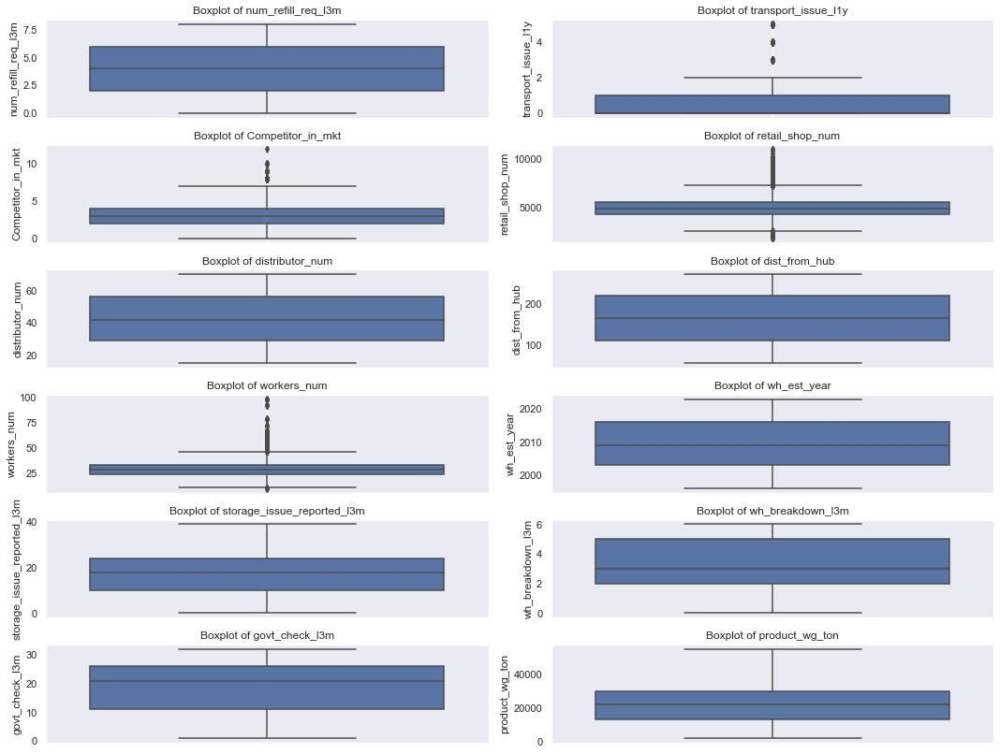

In [11]:

fig=plt.figure(figsize=(15,15))
for i in range(0,len(df_num.columns)):
    ax=fig.add_subplot(8,2,i+1)
    g=sns.boxplot(y=df_num[df_num.columns[i]])
    plt.title('Boxplot of {}'.format(df_num.columns[i]))


    plt.grid()

plt.tight_layout()


Description of num_refill_req_l3m
----------------------------------------------------------------------------
count    25000.000000
mean         4.089040
std          2.606612
min          0.000000
25%          2.000000
50%          4.000000
75%          6.000000
max          8.000000
Name: num_refill_req_l3m, dtype: float64

Interquartile range (IQR) of is  4.0
Range of values:  8 

Distribution of num_refill_req_l3m
----------------------------------------------------------------------------


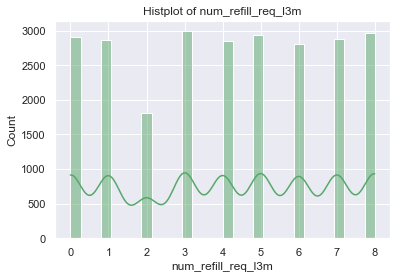

Description of transport_issue_l1y
----------------------------------------------------------------------------
count    25000.000000
mean         0.773680
std          1.199449
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          5.000000
Name: transport_issue_l1y, dtype: float64

Interquartile range (IQR) of is  1.0
Range of values:  5 

Distribution of transport_issue_l1y
----------------------------------------------------------------------------


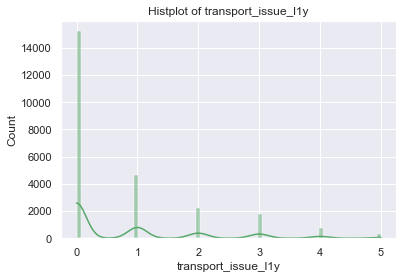

Description of Competitor_in_mkt
----------------------------------------------------------------------------
count    25000.000000
mean         3.104200
std          1.141663
min          0.000000
25%          2.000000
50%          3.000000
75%          4.000000
max         12.000000
Name: Competitor_in_mkt, dtype: float64

Interquartile range (IQR) of is  2.0
Range of values:  12 

Distribution of Competitor_in_mkt
----------------------------------------------------------------------------


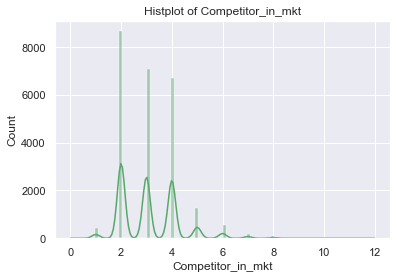

Description of retail_shop_num
----------------------------------------------------------------------------
count    25000.000000
mean      4985.711560
std       1052.825252
min       1821.000000
25%       4313.000000
50%       4859.000000
75%       5500.000000
max      11008.000000
Name: retail_shop_num, dtype: float64

Interquartile range (IQR) of is  1187.0
Range of values:  9187 

Distribution of retail_shop_num
----------------------------------------------------------------------------


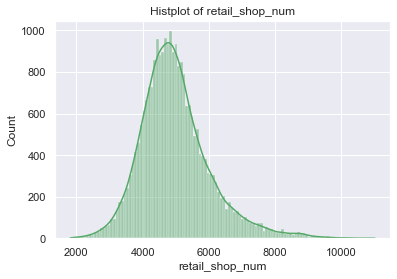

Description of distributor_num
----------------------------------------------------------------------------
count    25000.000000
mean        42.418120
std         16.064329
min         15.000000
25%         29.000000
50%         42.000000
75%         56.000000
max         70.000000
Name: distributor_num, dtype: float64

Interquartile range (IQR) of is  27.0
Range of values:  55 

Distribution of distributor_num
----------------------------------------------------------------------------


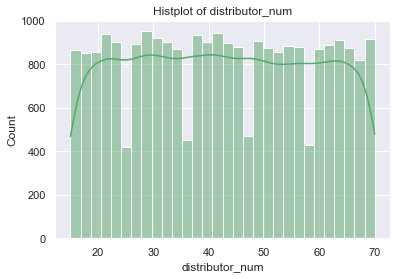

Description of dist_from_hub
----------------------------------------------------------------------------
count    25000.000000
mean       163.537320
std         62.718609
min         55.000000
25%        109.000000
50%        164.000000
75%        218.000000
max        271.000000
Name: dist_from_hub, dtype: float64

Interquartile range (IQR) of is  109.0
Range of values:  216 

Distribution of dist_from_hub
----------------------------------------------------------------------------


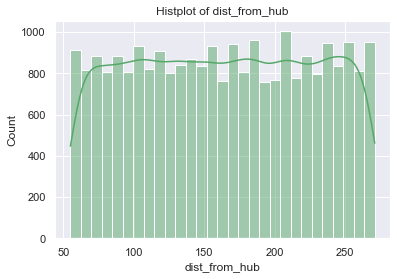

Description of workers_num
----------------------------------------------------------------------------
count    24010.000000
mean        28.944398
std          7.872534
min         10.000000
25%         24.000000
50%         28.000000
75%         33.000000
max         98.000000
Name: workers_num, dtype: float64

Interquartile range (IQR) of is  nan
Range of values:  88.0 

Distribution of workers_num
----------------------------------------------------------------------------


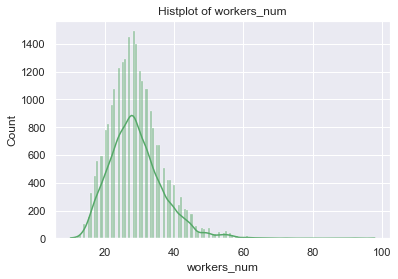

Description of wh_est_year
----------------------------------------------------------------------------
count    13119.000000
mean      2009.383185
std          7.528230
min       1996.000000
25%       2003.000000
50%       2009.000000
75%       2016.000000
max       2023.000000
Name: wh_est_year, dtype: float64

Interquartile range (IQR) of is  nan
Range of values:  27.0 

Distribution of wh_est_year
----------------------------------------------------------------------------


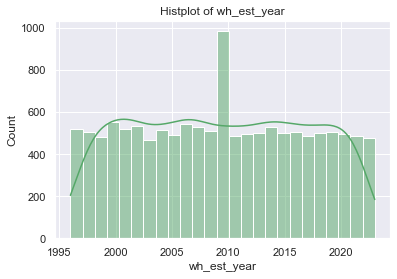

Description of storage_issue_reported_l3m
----------------------------------------------------------------------------
count    25000.000000
mean        17.130440
std          9.161108
min          0.000000
25%         10.000000
50%         18.000000
75%         24.000000
max         39.000000
Name: storage_issue_reported_l3m, dtype: float64

Interquartile range (IQR) of is  14.0
Range of values:  39 

Distribution of storage_issue_reported_l3m
----------------------------------------------------------------------------


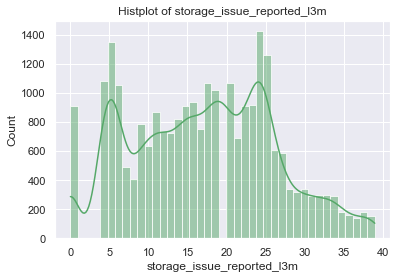

Description of wh_breakdown_l3m
----------------------------------------------------------------------------
count    25000.000000
mean         3.482040
std          1.690335
min          0.000000
25%          2.000000
50%          3.000000
75%          5.000000
max          6.000000
Name: wh_breakdown_l3m, dtype: float64

Interquartile range (IQR) of is  3.0
Range of values:  6 

Distribution of wh_breakdown_l3m
----------------------------------------------------------------------------


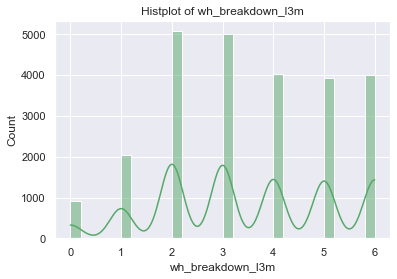

Description of govt_check_l3m
----------------------------------------------------------------------------
count    25000.000000
mean        18.812280
std          8.632382
min          1.000000
25%         11.000000
50%         21.000000
75%         26.000000
max         32.000000
Name: govt_check_l3m, dtype: float64

Interquartile range (IQR) of is  15.0
Range of values:  31 

Distribution of govt_check_l3m
----------------------------------------------------------------------------


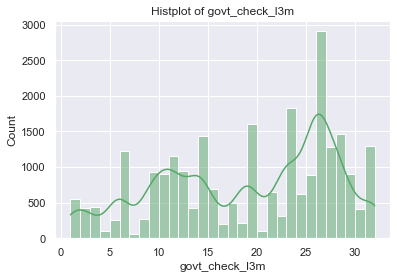

Description of product_wg_ton
----------------------------------------------------------------------------
count    25000.000000
mean     22102.632920
std      11607.755077
min       2065.000000
25%      13059.000000
50%      22101.000000
75%      30103.000000
max      55151.000000
Name: product_wg_ton, dtype: float64

Interquartile range (IQR) of is  17044.0
Range of values:  53086 

Distribution of product_wg_ton
----------------------------------------------------------------------------


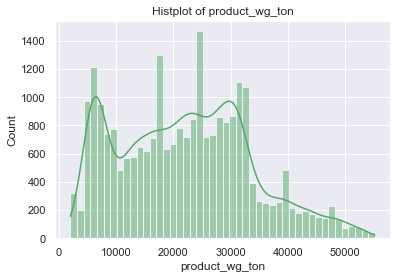

In [12]:
lstnumericcolumns = list(df_num.columns.values)
lstnumericcolumns = [e for e in lstnumericcolumns if e not in ('electric_supply','flood_proof','flood_impacted','temp_reg_mach')]

def univariateAnalysis_numeric(column):
    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df_num[column].describe(),end='\n\n')
    print('Interquartile range (IQR) of is ', round(stats.iqr(df_num[column]),3))
    print('Range of values: ', round(df_num[column].max()-df_num[column].min(),3),"\n")
    
    
    plt.figure()
    print("Distribution of " + column)
    print("----------------------------------------------------------------------------")
    sns.histplot(df_num[column], kde=True, color='g');
    plt.title('Histplot of {}'.format(column))

    plt.show()

for x in lstnumericcolumns:
    univariateAnalysis_numeric(x)


In [13]:
df_obj =df.loc[:, ~df.columns.isin(['Ware_house_ID', 'WH_Manager_ID'])].select_dtypes(include = ['object'])
df_obj

,Location_type,WH_capacity_size,zone,WH_regional_zone,wh_owner_type,approved_wh_govt_certificate
0,Urban,Small,West,Zone 6,Rented,A
1,Rural,Large,North,Zone 5,Company Owned,A
2,Rural,Mid,South,Zone 2,Company Owned,A
3,Rural,Mid,North,Zone 3,Rented,A+
4,Rural,Large,North,Zone 5,Company Owned,C
5,Rural,Small,West,Zone 1,Rented,A+
6,Rural,Large,West,Zone 6,Company Owned,B
7,Rural,Large,North,Zone 5,Rented,C
8,Rural,Small,South,Zone 6,Rented,A+
9,Rural,Small,South,Zone 6,Company Owned,C


In [14]:
lstnumericcolumns

['num_refill_req_l3m',
 'transport_issue_l1y',
 'Competitor_in_mkt',
 'retail_shop_num',
 'distributor_num',
 'dist_from_hub',
 'workers_num',
 'wh_est_year',
 'storage_issue_reported_l3m',
 'wh_breakdown_l3m',
 'govt_check_l3m',
 'product_wg_ton']

Value Count of Location_type
----------------------------------------------------------------------------
Rural    22957
Urban     2043
Name: Location_type, dtype: int64

Description of Location_type
----------------------------------------------------------------------------
count     25000
unique        2
top       Rural
freq      22957
Name: Location_type, dtype: object

Countplot of Location_type
----------------------------------------------------------------------------


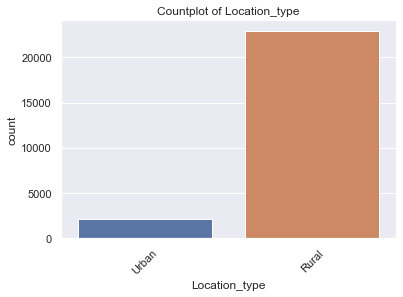

Value Count of WH_capacity_size
----------------------------------------------------------------------------
Large    10169
Mid      10020
Small     4811
Name: WH_capacity_size, dtype: int64

Description of WH_capacity_size
----------------------------------------------------------------------------
count     25000
unique        3
top       Large
freq      10169
Name: WH_capacity_size, dtype: object

Countplot of WH_capacity_size
----------------------------------------------------------------------------


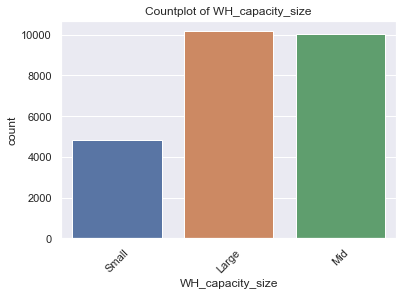

Value Count of zone
----------------------------------------------------------------------------
North    10278
West      7931
South     6362
East       429
Name: zone, dtype: int64

Description of zone
----------------------------------------------------------------------------
count     25000
unique        4
top       North
freq      10278
Name: zone, dtype: object

Countplot of zone
----------------------------------------------------------------------------


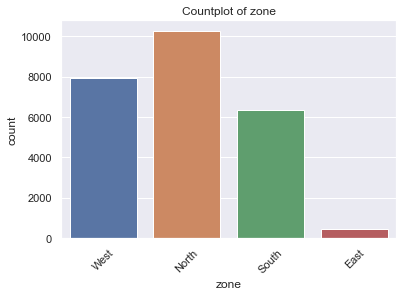

Value Count of WH_regional_zone
----------------------------------------------------------------------------
Zone 6    8339
Zone 5    4587
Zone 4    4176
Zone 2    2963
Zone 3    2881
Zone 1    2054
Name: WH_regional_zone, dtype: int64

Description of WH_regional_zone
----------------------------------------------------------------------------
count      25000
unique         6
top       Zone 6
freq        8339
Name: WH_regional_zone, dtype: object

Countplot of WH_regional_zone
----------------------------------------------------------------------------


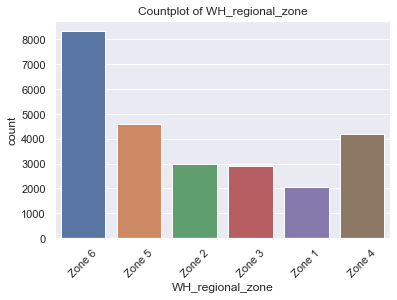

Value Count of wh_owner_type
----------------------------------------------------------------------------
Company Owned    13578
Rented           11422
Name: wh_owner_type, dtype: int64

Description of wh_owner_type
----------------------------------------------------------------------------
count             25000
unique                2
top       Company Owned
freq              13578
Name: wh_owner_type, dtype: object

Countplot of wh_owner_type
----------------------------------------------------------------------------


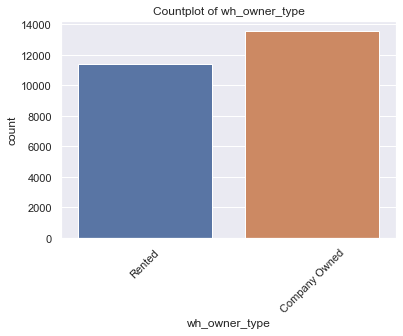

Value Count of approved_wh_govt_certificate
----------------------------------------------------------------------------
C     5501
B+    4917
B     4812
A     4671
A+    4191
Name: approved_wh_govt_certificate, dtype: int64

Description of approved_wh_govt_certificate
----------------------------------------------------------------------------
count     24092
unique        5
top           C
freq       5501
Name: approved_wh_govt_certificate, dtype: object

Countplot of approved_wh_govt_certificate
----------------------------------------------------------------------------


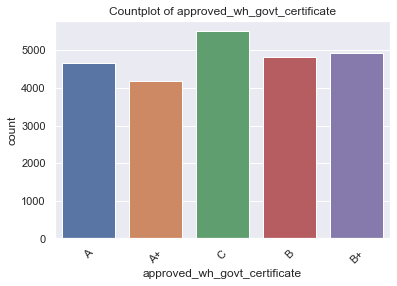

Value Count of electric_supply
----------------------------------------------------------------------------
1    16422
0     8578
Name: electric_supply, dtype: int64

Description of electric_supply
----------------------------------------------------------------------------
count    25000.000000
mean         0.656880
std          0.474761
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: electric_supply, dtype: float64

Countplot of electric_supply
----------------------------------------------------------------------------


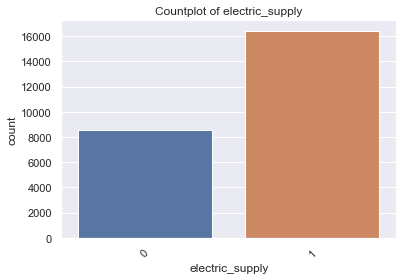

Value Count of flood_proof
----------------------------------------------------------------------------
0    23634
1     1366
Name: flood_proof, dtype: int64

Description of flood_proof
----------------------------------------------------------------------------
count    25000.000000
mean         0.054640
std          0.227281
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: flood_proof, dtype: float64

Countplot of flood_proof
----------------------------------------------------------------------------


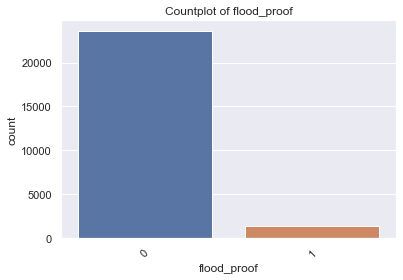

Value Count of flood_impacted
----------------------------------------------------------------------------
0    22546
1     2454
Name: flood_impacted, dtype: int64

Description of flood_impacted
----------------------------------------------------------------------------
count    25000.000000
mean         0.098160
std          0.297537
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: flood_impacted, dtype: float64

Countplot of flood_impacted
----------------------------------------------------------------------------


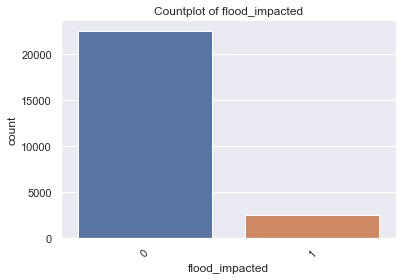

Value Count of temp_reg_mach
----------------------------------------------------------------------------
0    17418
1     7582
Name: temp_reg_mach, dtype: int64

Description of temp_reg_mach
----------------------------------------------------------------------------
count    25000.000000
mean         0.303280
std          0.459684
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: temp_reg_mach, dtype: float64

Countplot of temp_reg_mach
----------------------------------------------------------------------------


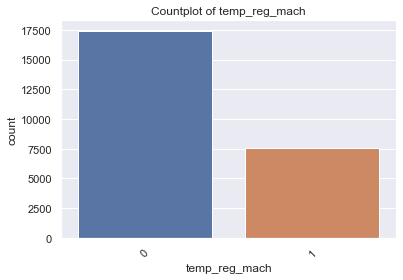

In [15]:
lstobjcolumns = list(df_obj.columns.values)
obj1num=['electric_supply','flood_proof','flood_impacted','temp_reg_mach']
lstobjcolumns.extend(obj1num)

def univariateAnalysis_obj(column):
    print("Value Count of " + column)
    print("----------------------------------------------------------------------------")
    print(df[column].value_counts(),end='\n\n')

    print("Description of " + column)
    print("----------------------------------------------------------------------------")
    print(df[column].describe(),end='\n\n')
    
    
    plt.figure()
    print("Countplot of " + column)
    print("----------------------------------------------------------------------------")
    sns.countplot(x=df[column]);
    plt.title('Countplot of {}'.format(column))

    plt.xticks(rotation=45)
    
    
    plt.show()
for x in lstobjcolumns:
    univariateAnalysis_obj(x)


In [16]:
for columns in df_num.columns:
    print('Skewness of {} is'.format(columns), round(df_num[columns].skew(),2))
    print('Kurtosis of {} is'.format(columns), round(df_num[columns].kurt(),2))


Skewness of num_refill_req_l3m is -0.08
Kurtosis of num_refill_req_l3m is -1.22
Skewness of transport_issue_l1y is 1.61
Kurtosis of transport_issue_l1y is 1.84
Skewness of Competitor_in_mkt is 0.98
Kurtosis of Competitor_in_mkt is 1.79
Skewness of retail_shop_num is 0.91
Kurtosis of retail_shop_num is 1.85
Skewness of distributor_num is 0.02
Kurtosis of distributor_num is -1.19
Skewness of dist_from_hub is -0.01
Kurtosis of dist_from_hub is -1.2
Skewness of workers_num is 1.06
Kurtosis of workers_num is 3.41
Skewness of wh_est_year is 0.01
Kurtosis of wh_est_year is -1.18
Skewness of storage_issue_reported_l3m is 0.11
Kurtosis of storage_issue_reported_l3m is -0.68
Skewness of wh_breakdown_l3m is -0.07
Kurtosis of wh_breakdown_l3m is -0.95
Skewness of govt_check_l3m is -0.36
Kurtosis of govt_check_l3m is -1.06
Skewness of product_wg_ton is 0.33
Kurtosis of product_wg_ton is -0.5


## Bivariate Analysis

                                                       Pairplot


<Figure size 864x1080 with 0 Axes>

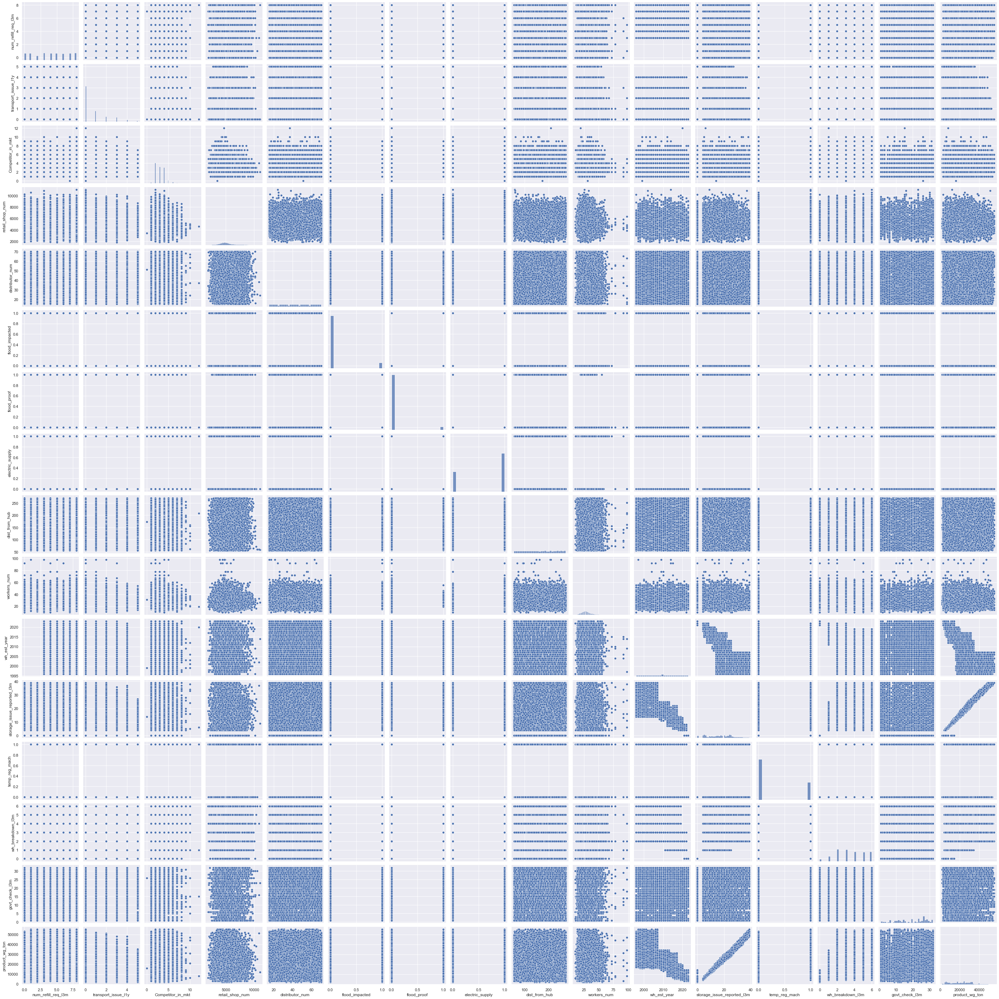

In [17]:
plt.figure(figsize=(12,15));
print('                                                       Pairplot');
sns.pairplot(df, corner=False);

plt.show();

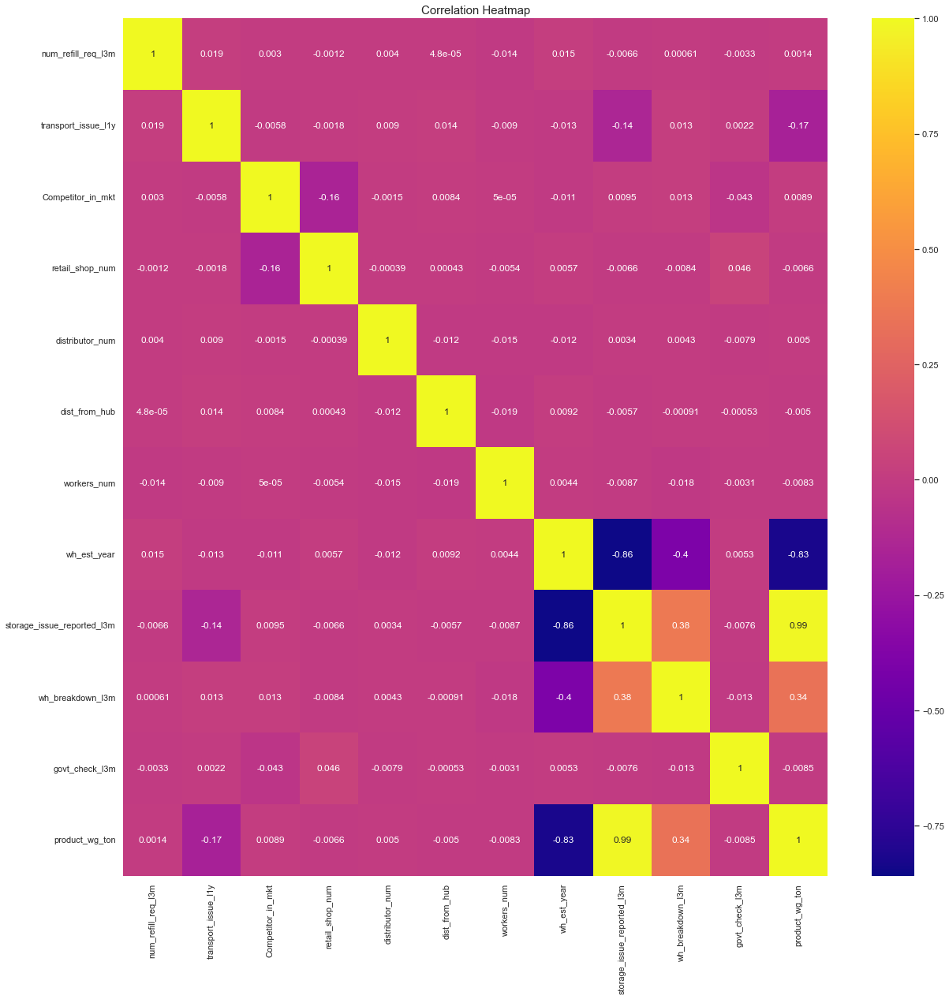

In [18]:
corr=df_num.corr()
#mask = np.triu(np.ones_like(corr)) 
plt.figure(figsize=(20,20))
sns.heatmap(corr, annot=True,cmap='plasma');
plt.title('Correlation Heatmap',fontsize=15);


## Removing unwanted variables

In [19]:
df.drop(['Ware_house_ID','WH_Manager_ID'],axis=1,inplace=True)
df.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,Urban,Small,West,Zone 6,3,1,2,4651,Rented,24,0,1,1,91,29.0,NaN,13,0,A,5,15,17115
1,Rural,Large,North,Zone 5,0,0,4,6217,Company Owned,47,0,0,1,210,31.0,NaN,4,0,A,3,17,5074
2,Rural,Mid,South,Zone 2,1,0,4,4306,Company Owned,64,0,0,0,161,37.0,NaN,17,0,A,6,22,23137
3,Rural,Mid,North,Zone 3,7,4,2,6000,Rented,50,0,0,0,103,21.0,NaN,17,1,A+,3,27,22115
4,Rural,Large,North,Zone 5,3,1,2,4740,Company Owned,42,1,0,1,112,25.0,2009.0,18,0,C,6,24,24071


## Missing Value Treatment

In [20]:
df.isnull().sum()

Location_type                       0
WH_capacity_size                    0
zone                                0
WH_regional_zone                    0
num_refill_req_l3m                  0
transport_issue_l1y                 0
Competitor_in_mkt                   0
retail_shop_num                     0
wh_owner_type                       0
distributor_num                     0
flood_impacted                      0
flood_proof                         0
electric_supply                     0
dist_from_hub                       0
workers_num                       990
wh_est_year                     11881
storage_issue_reported_l3m          0
temp_reg_mach                       0
approved_wh_govt_certificate      908
wh_breakdown_l3m                    0
govt_check_l3m                      0
product_wg_ton                      0
dtype: int64

In [21]:
df.drop('wh_est_year',axis=1,inplace=True)

In [22]:
df_na1 = df.isna().sum()

df_na1[df_na1.values > 0]

workers_num                     990
approved_wh_govt_certificate    908
dtype: int64

In [23]:
df_na1[df_na1.values > 0].index

Index(['workers_num', 'approved_wh_govt_certificate'], dtype='object')

In [24]:
df1 = df.copy()
df1['workers_num'].fillna(df1['workers_num'].median(),inplace=True)
df_na2 = df1.isna().sum()

df_na2[df_na2.values > 0]

approved_wh_govt_certificate    908
dtype: int64

In [25]:
df1['approved_wh_govt_certificate'].mode()

0    C
Name: approved_wh_govt_certificate, dtype: object

In [26]:
#df1['approved_wh_govt_certificate']=df1['approved_wh_govt_certificate'].fillna(df1['approved_wh_govt_certificate'].mode())
#df1['approved_wh_govt_certificate'].replace('NaN', 'C',inplace=True)
df1['approved_wh_govt_certificate'].fillna('C', inplace=True)

df1.isna().sum()



Location_type                   0
WH_capacity_size                0
zone                            0
WH_regional_zone                0
num_refill_req_l3m              0
transport_issue_l1y             0
Competitor_in_mkt               0
retail_shop_num                 0
wh_owner_type                   0
distributor_num                 0
flood_impacted                  0
flood_proof                     0
electric_supply                 0
dist_from_hub                   0
workers_num                     0
storage_issue_reported_l3m      0
temp_reg_mach                   0
approved_wh_govt_certificate    0
wh_breakdown_l3m                0
govt_check_l3m                  0
product_wg_ton                  0
dtype: int64

## Outlier Treatment

In [27]:
lstnumericcolumns.remove('wh_est_year')

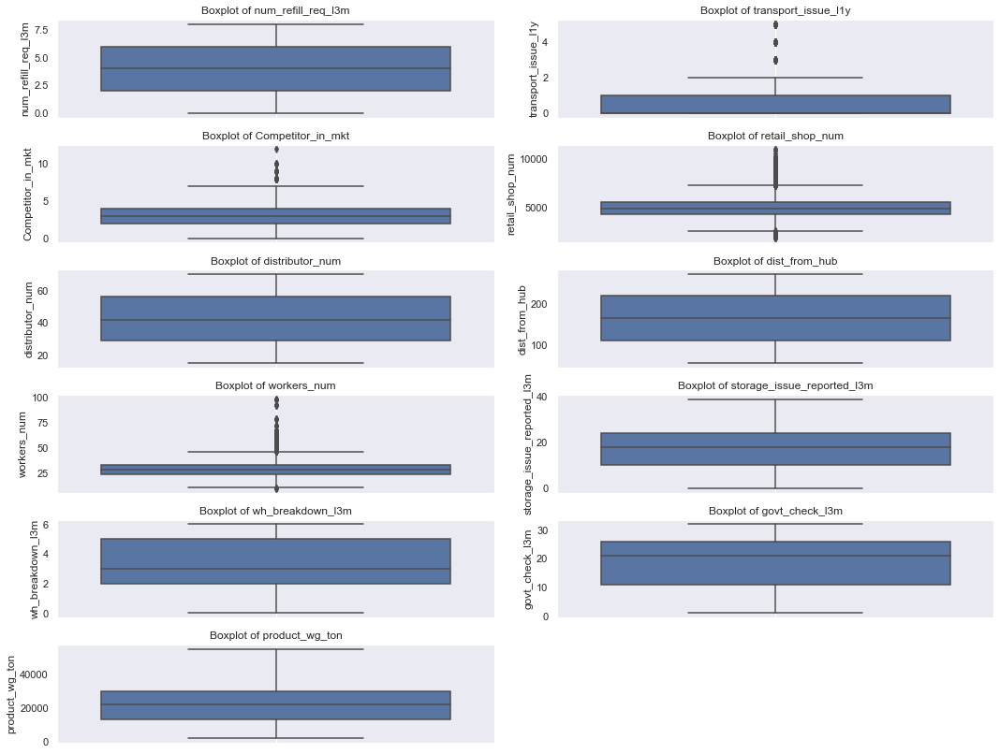

In [28]:
#lstnumericcolumns=lstnumericcolumns.remove('')
fig=plt.figure(figsize=(15,15))
for idx, i in enumerate(lstnumericcolumns):
    ax=fig.add_subplot(8,2,idx+1)
    g=sns.boxplot(y=df1[i])
    plt.title('Boxplot of {}'.format(i))


    plt.grid()

plt.tight_layout()


In [29]:
def proportion_outlier(column):
    Q1=df1[column].quantile(q=0.25)
    Q3=df1[column].quantile(q=0.75)
    IQR=stats.iqr(df1[column])   
    
    L_outlier=Q1-1.5*(Q3-Q1)
    U_outlier=Q3+1.5*(Q3-Q1)
    print('Lower Bound in ' +column+ ' is : ', L_outlier)
    print('Upper Bound in ' +column+ ' is : ', U_outlier)
    print('Number of outliers above '+column + ' upper bound : ', df1[df1[column]>U_outlier][column].count())
    print('Number of outliers below '+column + ' lower bound : ', df1[df1[column]<L_outlier][column].count())
    print('% of Outlier in '+column + ' upper: ',round(df1[df1[column]>U_outlier][column].count()*100/len(df1)), '%')
    print('% of Outlier in '+column + ' lower: ',round(df1[df1[column]<L_outlier][column].count()*100/len(df1)), '%')
    print('-----------------------------------------------------')

for x in lstnumericcolumns:
    proportion_outlier(x)

Lower Bound in num_refill_req_l3m is :  -4.0
Upper Bound in num_refill_req_l3m is :  12.0
Number of outliers above num_refill_req_l3m upper bound :  0
Number of outliers below num_refill_req_l3m lower bound :  0
% of Outlier in num_refill_req_l3m upper:  0 %
% of Outlier in num_refill_req_l3m lower:  0 %
-----------------------------------------------------
Lower Bound in transport_issue_l1y is :  -1.5
Upper Bound in transport_issue_l1y is :  2.5
Number of outliers above transport_issue_l1y upper bound :  2943
Number of outliers below transport_issue_l1y lower bound :  0
% of Outlier in transport_issue_l1y upper:  12 %
% of Outlier in transport_issue_l1y lower:  0 %
-----------------------------------------------------
Lower Bound in Competitor_in_mkt is :  -1.0
Upper Bound in Competitor_in_mkt is :  7.0
Number of outliers above Competitor_in_mkt upper bound :  96
Number of outliers below Competitor_in_mkt lower bound :  0
% of Outlier in Competitor_in_mkt upper:  0 %
% of Outlier in C

In [30]:
def treat_outlier(column):
   # q5= df_num[column].quantile(q=0.05)
    q25=df1[column].quantile(q=0.25)
    q75=df1[column].quantile(q=0.75)
   # dt=df_num[column].quantile(q=0.95)
    #calculationg IQR range
    IQR=stats.iqr(df1[column])   
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Calculating maximum threshold
    #print(lower_bound,q25,q75,upper_bound,min,max)
    #Capping outliers
    return df1[column].apply(lambda y: upper_bound if y > upper_bound else y).apply(lambda y: lower_bound if y < lower_bound else y)
lstnum2=['Competitor_in_mkt','retail_shop_num','workers_num']
for i in lstnum2:
    df1[i]=treat_outlier(i)


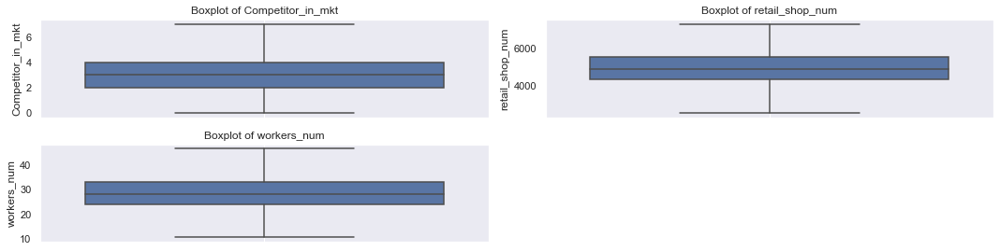

In [31]:
fig=plt.figure(figsize=(15,15))
for idx, i in enumerate(lstnum2):
    ax=fig.add_subplot(8,2,idx+1)
    g=sns.boxplot(y=df1[i])
    plt.title('Boxplot of {}'.format(i))


    plt.grid()

plt.tight_layout()


## Variable Transformation

In [32]:
df_obj.columns.values

array(['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone',
       'wh_owner_type', 'approved_wh_govt_certificate'], dtype=object)

In [33]:
lst1=['Location_type', 'zone', 'WH_regional_zone','wh_owner_type']
le = LabelEncoder()
for feat in lst1:
    df1[feat] = le.fit_transform(df1[feat].astype(str))
df1.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,1,Small,3,5,3,1,2.0,4651.0,1,24,0,1,1,91,29.0,13,0,A,5,15,17115
1,0,Large,1,4,0,0,4.0,6217.0,0,47,0,0,1,210,31.0,4,0,A,3,17,5074
2,0,Mid,2,1,1,0,4.0,4306.0,0,64,0,0,0,161,37.0,17,0,A,6,22,23137
3,0,Mid,1,2,7,4,2.0,6000.0,1,50,0,0,0,103,21.0,17,1,A+,3,27,22115
4,0,Large,1,4,3,1,2.0,4740.0,0,42,1,0,1,112,25.0,18,0,C,6,24,24071


In [34]:
capa_dict = {'Small': 0,
            'Mid': 1,
            'Large': 2
           }
df1.WH_capacity_size = df1.WH_capacity_size.map(capa_dict)
df1.WH_capacity_size.astype(str).astype(int)

certif_dict = {'C': 0,
            'B': 1,
            'B+': 2,
            'A': 3,
            'A+':4
           }
df1.approved_wh_govt_certificate = df1.approved_wh_govt_certificate.map(certif_dict)
df1.approved_wh_govt_certificate.astype(str).astype(int)
df1.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,1,0,3,5,3,1,2.0,4651.0,1,24,0,1,1,91,29.0,13,0,3,5,15,17115
1,0,2,1,4,0,0,4.0,6217.0,0,47,0,0,1,210,31.0,4,0,3,3,17,5074
2,0,1,2,1,1,0,4.0,4306.0,0,64,0,0,0,161,37.0,17,0,3,6,22,23137
3,0,1,1,2,7,4,2.0,6000.0,1,50,0,0,0,103,21.0,17,1,4,3,27,22115
4,0,2,1,4,3,1,2.0,4740.0,0,42,1,0,1,112,25.0,18,0,0,6,24,24071


In [35]:
capa_dict

{'Small': 0, 'Mid': 1, 'Large': 2}

In [36]:
certif_dict

{'C': 0, 'B': 1, 'B+': 2, 'A': 3, 'A+': 4}

In [37]:
lstnumericcolumns

['num_refill_req_l3m',
 'transport_issue_l1y',
 'Competitor_in_mkt',
 'retail_shop_num',
 'distributor_num',
 'dist_from_hub',
 'workers_num',
 'storage_issue_reported_l3m',
 'wh_breakdown_l3m',
 'govt_check_l3m',
 'product_wg_ton']

In [38]:
lstobjcolumns

['Location_type',
 'WH_capacity_size',
 'zone',
 'WH_regional_zone',
 'wh_owner_type',
 'approved_wh_govt_certificate',
 'electric_supply',
 'flood_proof',
 'flood_impacted',
 'temp_reg_mach']

In [39]:
for feat in lstobjcolumns:
    print(df1[feat].value_counts(normalize=True))
    print('\n')


0    0.91828
1    0.08172
Name: Location_type, dtype: float64


2    0.40676
1    0.40080
0    0.19244
Name: WH_capacity_size, dtype: float64


1    0.41112
3    0.31724
2    0.25448
0    0.01716
Name: zone, dtype: float64


5    0.33356
4    0.18348
3    0.16704
1    0.11852
2    0.11524
0    0.08216
Name: WH_regional_zone, dtype: float64


0    0.54312
1    0.45688
Name: wh_owner_type, dtype: float64


0    0.25636
2    0.19668
1    0.19248
3    0.18684
4    0.16764
Name: approved_wh_govt_certificate, dtype: float64


1    0.65688
0    0.34312
Name: electric_supply, dtype: float64


0    0.94536
1    0.05464
Name: flood_proof, dtype: float64


0    0.90184
1    0.09816
Name: flood_impacted, dtype: float64


0    0.69672
1    0.30328
Name: temp_reg_mach, dtype: float64




##  Model building and interpretation.

### Split data

In [40]:
df2=df1.copy()

X1 = df2.drop('product_wg_ton', axis=1)
y1 = df2[['product_wg_ton']]

from sklearn.model_selection import train_test_split

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.30 , random_state=1)


In [41]:
df2.head()

,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,wh_owner_type,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton
0,1,0,3,5,3,1,2.0,4651.0,1,24,0,1,1,91,29.0,13,0,3,5,15,17115
1,0,2,1,4,0,0,4.0,6217.0,0,47,0,0,1,210,31.0,4,0,3,3,17,5074
2,0,1,2,1,1,0,4.0,4306.0,0,64,0,0,0,161,37.0,17,0,3,6,22,23137
3,0,1,1,2,7,4,2.0,6000.0,1,50,0,0,0,103,21.0,17,1,4,3,27,22115
4,0,2,1,4,3,1,2.0,4740.0,0,42,1,0,1,112,25.0,18,0,0,6,24,24071


In [42]:
df2.shape

(25000, 21)

In [43]:

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [44]:
calc_vif(X_train1).sort_values(by='VIF', ascending = True)

,variables,VIF
11,flood_proof,1.079536
0,Location_type,1.098069
10,flood_impacted,1.162842
5,transport_issue_l1y,1.441780
16,temp_reg_mach,1.702731
8,wh_owner_type,1.939171
17,approved_wh_govt_certificate,3.036388
12,electric_supply,3.519292
4,num_refill_req_l3m,3.659013
1,WH_capacity_size,5.119643


### Scaling

In [45]:
lstnumericcolumns

['num_refill_req_l3m',
 'transport_issue_l1y',
 'Competitor_in_mkt',
 'retail_shop_num',
 'distributor_num',
 'dist_from_hub',
 'workers_num',
 'storage_issue_reported_l3m',
 'wh_breakdown_l3m',
 'govt_check_l3m',
 'product_wg_ton']

In [46]:
lstobjcolumns

['Location_type',
 'WH_capacity_size',
 'zone',
 'WH_regional_zone',
 'wh_owner_type',
 'approved_wh_govt_certificate',
 'electric_supply',
 'flood_proof',
 'flood_impacted',
 'temp_reg_mach']

In [47]:
lstnum2=['num_refill_req_l3m','transport_issue_l1y','Competitor_in_mkt','retail_shop_num','distributor_num','dist_from_hub','workers_num','storage_issue_reported_l3m','wh_breakdown_l3m','govt_check_l3m']
lstnum2

['num_refill_req_l3m',
 'transport_issue_l1y',
 'Competitor_in_mkt',
 'retail_shop_num',
 'distributor_num',
 'dist_from_hub',
 'workers_num',
 'storage_issue_reported_l3m',
 'wh_breakdown_l3m',
 'govt_check_l3m']

In [48]:
#sc = StandardScaler() 
#X_train_scaled = sc.fit_transform(X_train) 
#X_test_sc = sc.transform (X_test)

obj_d1 = X_train1[lstobjcolumns]
obj_d2 = X_test1[lstobjcolumns]

#num_if1 = X_train1.select_dtypes(include=['int64','float64'])
#num_if2 = X_test1.select_dtypes(include=['int64','float64'])

X_train_num_scaled  = X_train1[lstnum2].apply(zscore)
X_test_num_scaled = X_test1[lstnum2].apply(zscore)

### final y scaled
#y_train_scaled = y_train1.apply(zscore)
#y_test_scaled = y_test1.apply(zscore)


In [49]:
X_train_scaled=pd.concat([X_train_num_scaled, obj_d1], axis=1)
X_test_scaled=pd.concat([X_test_num_scaled, obj_d2], axis=1)

X_train_num_scaled.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,wh_breakdown_l3m,govt_check_l3m
4289,-1.572831,1.025044,0.815534,0.083306,0.034428,-0.576433,0.461883,0.310993,0.898260,-0.563041
19621,0.728712,1.025044,-0.081953,2.410191,1.030485,1.352764,-0.099531,-0.232995,-0.282329,1.291771
14965,0.728712,-0.641462,0.815534,0.697740,-0.214586,-1.596835,-0.099531,1.507767,-0.872624,-0.910819
12321,0.728712,0.191791,-0.081953,-0.734905,0.719217,1.544090,0.321529,1.181374,-0.872624,-1.954150
6269,-0.038469,2.691549,-0.081953,2.410191,-1.210643,-0.305389,1.023296,0.637386,1.488554,0.828068


In [50]:
X_test_num_scaled.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,wh_breakdown_l3m,govt_check_l3m
21492,0.359705,-0.653441,-0.984130,-2.135454,-0.893275,-0.246111,0.725273,0.648607,0.897563,0.496440
9488,-1.175528,0.181450,0.777019,-0.084657,-1.204503,-0.389649,0.446304,-1.331716,-1.481347,0.727780
16933,0.359705,-0.653441,-0.103556,-0.587103,0.974095,1.476344,-0.251119,-1.221698,-0.291892,0.033760
12604,0.743514,1.851231,-0.103556,0.629020,0.538375,-0.549136,-0.530088,0.098517,0.302835,0.033760
8222,1.127322,-0.653441,-0.103556,-0.772700,-0.457555,0.822449,-0.390603,0.758625,1.492290,-0.544589


In [51]:
X_train_scaled.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,wh_breakdown_l3m,govt_check_l3m,Location_type,WH_capacity_size,zone,WH_regional_zone,wh_owner_type,approved_wh_govt_certificate,electric_supply,flood_proof,flood_impacted,temp_reg_mach
4289,-1.572831,1.025044,0.815534,0.083306,0.034428,-0.576433,0.461883,0.310993,0.898260,-0.563041,0,2,3,4,1,1,1,0,0,0
19621,0.728712,1.025044,-0.081953,2.410191,1.030485,1.352764,-0.099531,-0.232995,-0.282329,1.291771,0,0,3,0,1,4,1,0,0,1
14965,0.728712,-0.641462,0.815534,0.697740,-0.214586,-1.596835,-0.099531,1.507767,-0.872624,-0.910819,0,1,3,3,1,1,1,0,0,0
12321,0.728712,0.191791,-0.081953,-0.734905,0.719217,1.544090,0.321529,1.181374,-0.872624,-1.954150,0,0,2,5,0,1,1,0,0,0
6269,-0.038469,2.691549,-0.081953,2.410191,-1.210643,-0.305389,1.023296,0.637386,1.488554,0.828068,1,1,3,3,0,2,1,0,0,0


In [52]:
X_test_scaled.head()

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,dist_from_hub,workers_num,storage_issue_reported_l3m,wh_breakdown_l3m,govt_check_l3m,Location_type,WH_capacity_size,zone,WH_regional_zone,wh_owner_type,approved_wh_govt_certificate,electric_supply,flood_proof,flood_impacted,temp_reg_mach
21492,0.359705,-0.653441,-0.984130,-2.135454,-0.893275,-0.246111,0.725273,0.648607,0.897563,0.496440,0,2,1,5,1,0,1,0,0,1
9488,-1.175528,0.181450,0.777019,-0.084657,-1.204503,-0.389649,0.446304,-1.331716,-1.481347,0.727780,0,2,3,4,1,1,0,0,0,0
16933,0.359705,-0.653441,-0.103556,-0.587103,0.974095,1.476344,-0.251119,-1.221698,-0.291892,0.033760,0,1,2,2,0,4,1,0,0,1
12604,0.743514,1.851231,-0.103556,0.629020,0.538375,-0.549136,-0.530088,0.098517,0.302835,0.033760,0,1,3,2,0,0,1,0,0,1
8222,1.127322,-0.653441,-0.103556,-0.772700,-0.457555,0.822449,-0.390603,0.758625,1.492290,-0.544589,0,2,1,4,0,2,1,0,0,1


In [53]:
X_train1.columns

Index(['Location_type', 'WH_capacity_size', 'zone', 'WH_regional_zone',
       'num_refill_req_l3m', 'transport_issue_l1y', 'Competitor_in_mkt',
       'retail_shop_num', 'wh_owner_type', 'distributor_num', 'flood_impacted',
       'flood_proof', 'electric_supply', 'dist_from_hub', 'workers_num',
       'storage_issue_reported_l3m', 'temp_reg_mach',
       'approved_wh_govt_certificate', 'wh_breakdown_l3m', 'govt_check_l3m'],
      dtype='object')

In [54]:
c=pd.concat([X_train1, y_train1], axis=1)


In [55]:
expr='product_wg_ton ~ Location_type + WH_capacity_size+ zone+ WH_regional_zone + num_refill_req_l3m+ transport_issue_l1y+ Competitor_in_mkt+retail_shop_num+ wh_owner_type+ distributor_num+ flood_impacted+flood_proof+ electric_supply+ dist_from_hub+ workers_num+storage_issue_reported_l3m+ temp_reg_mach+approved_wh_govt_certificate+ wh_breakdown_l3m + govt_check_l3m'
import statsmodels.formula.api as smf
lm1 = smf.ols(formula= expr, data = c).fit()
lm1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         product_wg_ton   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                 3.687e+04
Date:                Fri, 21 Oct 2022   Prob (F-statistic):               0.00
Time:                        21:45:01   Log-Likelihood:            -1.5573e+05
No. Observations:               17500   AIC:                         3.115e+05
Df Residuals:                   17479   BIC:                         3.117e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                     1286.9619    134.875      9.542      0.000    1022.593    1551.331
Location_type                 -108.6778     49.271     -2.206      0.027    -205.254     -12.101
WH_capacity_size                -9.3670     21.336     -0.439      0.661     -51.187      32.453
zone                            -2.9978     15.707     -0.191      0.849     -33.785      27.789
WH_regional_zone                -7.5969      9.512     -0.799      0.424     -26.242      11.048
num_refill_req_l3m              -0.3669      5.343     -0.069      0.945     -10.840      10.107
transport_issue_l1y           -310.9296     11.320    -27.466      0.000    -333.119    -288.740
Competitor_in_mkt               -7.7865     12.335     -0.631      0.528     -31.964      16.391
retail_shop_num                 -0.0135      0.014     -0.957      0.338      -0.041       0.014
wh_owner_type                   12.1975     27.965      0.436      0.663     -42.616      67.011
distributor_num                  1.2187      0.835      1.460      0.144      -0.417       2.855
flood_impacted                  17.6720     46.696      0.378      0.705     -73.858     109.202
flood_proof                     56.2171     60.247      0.933      0.351     -61.873     174.307
electric_supply                  9.3058     31.023      0.300      0.764     -51.502      70.114
dist_from_hub                    0.2670      0.214      1.249      0.212      -0.152       0.686
workers_num                     -0.2238      2.040     -0.110      0.913      -4.223       3.776
storage_issue_reported_l3m    1254.9724      1.624    772.843      0.000    1251.790    1258.155
temp_reg_mach                  848.5634     31.632     26.826      0.000     786.562     910.565
approved_wh_govt_certificate   109.8782     10.130     10.846      0.000      90.021     129.735
wh_breakdown_l3m              -244.4290      8.624    -28.344      0.000    -261.332    -227.526
govt_check_l3m                  -0.1288      1.655     -0.078      0.938      -3.374       3.116
==============================================================================
Omnibus:                     5892.300   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            35935.755
Skew:                           1.485   Prob(JB):                         0.00
Kurtosis:                       9.361   Cond. No.                     5.09e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.09e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [56]:
l1=['flood_proof','flood_impacted','num_refill_req_l3m','electric_supply','wh_owner_type','Location_type','transport_issue_l1y','storage_issue_reported_l3m','approved_wh_govt_certificate','temp_reg_mach','wh_breakdown_l3m']
X_train1=X_train1[l1]
X_train1.head()

,flood_proof,flood_impacted,num_refill_req_l3m,electric_supply,wh_owner_type,Location_type,transport_issue_l1y,storage_issue_reported_l3m,approved_wh_govt_certificate,temp_reg_mach,wh_breakdown_l3m
4289,0,0,0,1,1,0,2,20,1,0,5
19621,0,0,6,1,1,0,2,15,4,1,3
14965,0,0,6,1,1,0,0,31,1,0,2
12321,0,0,6,1,0,0,1,28,1,0,2
6269,0,0,4,1,0,1,4,23,2,0,6


In [57]:
l1

['flood_proof',
 'flood_impacted',
 'num_refill_req_l3m',
 'electric_supply',
 'wh_owner_type',
 'Location_type',
 'transport_issue_l1y',
 'storage_issue_reported_l3m',
 'approved_wh_govt_certificate',
 'temp_reg_mach',
 'wh_breakdown_l3m']

In [58]:
X_test1=X_test1[l1]
X_test1.head()

,flood_proof,flood_impacted,num_refill_req_l3m,electric_supply,wh_owner_type,Location_type,transport_issue_l1y,storage_issue_reported_l3m,approved_wh_govt_certificate,temp_reg_mach,wh_breakdown_l3m
21492,0,0,5,1,1,0,0,23,0,1,5
9488,0,0,1,0,1,0,1,5,1,0,1
16933,0,0,5,1,0,0,0,6,4,1,3
12604,0,0,6,1,0,0,3,18,0,1,4
8222,0,0,7,1,0,0,0,24,2,1,6


In [59]:
X_train_scaled=X_train_scaled[l1]
X_test_scaled=X_test_scaled[l1]

X_train_scaled.head()

,flood_proof,flood_impacted,num_refill_req_l3m,electric_supply,wh_owner_type,Location_type,transport_issue_l1y,storage_issue_reported_l3m,approved_wh_govt_certificate,temp_reg_mach,wh_breakdown_l3m
4289,0,0,-1.572831,1,1,0,1.025044,0.310993,1,0,0.898260
19621,0,0,0.728712,1,1,0,1.025044,-0.232995,4,1,-0.282329
14965,0,0,0.728712,1,1,0,-0.641462,1.507767,1,0,-0.872624
12321,0,0,0.728712,1,0,0,0.191791,1.181374,1,0,-0.872624
6269,0,0,-0.038469,1,0,1,2.691549,0.637386,2,0,1.488554


In [60]:
X_test_scaled=X_test_scaled[l1]
X_test_scaled.head()

,flood_proof,flood_impacted,num_refill_req_l3m,electric_supply,wh_owner_type,Location_type,transport_issue_l1y,storage_issue_reported_l3m,approved_wh_govt_certificate,temp_reg_mach,wh_breakdown_l3m
21492,0,0,0.359705,1,1,0,-0.653441,0.648607,0,1,0.897563
9488,0,0,-1.175528,0,1,0,0.181450,-1.331716,1,0,-1.481347
16933,0,0,0.359705,1,0,0,-0.653441,-1.221698,4,1,-0.291892
12604,0,0,0.743514,1,0,0,1.851231,0.098517,0,1,0.302835
8222,0,0,1.127322,1,0,0,-0.653441,0.758625,2,1,1.492290


## Linear Regression - with scaled data

In [61]:
regr1 = LinearRegression()
regr1.fit(X_train_scaled, y_train1)


LinearRegression()

In [62]:
for idx, col_name in enumerate(X_train_scaled.columns):
    print("The coefficient for {} is {}".format(col_name, round(regr1.coef_[0][idx],3)))


The coefficient for flood_proof is 53.916
The coefficient for flood_impacted is 18.602
The coefficient for num_refill_req_l3m is -1.117
The coefficient for electric_supply is 8.179
The coefficient for wh_owner_type is 11.93
The coefficient for Location_type is -110.898
The coefficient for transport_issue_l1y is -372.613
The coefficient for storage_issue_reported_l3m is 11534.658
The coefficient for approved_wh_govt_certificate is 109.975
The coefficient for temp_reg_mach is 848.5
The coefficient for wh_breakdown_l3m is -413.874


In [63]:
intercept1 = round(regr1.intercept_[0],3)

print("The intercept for our model is {}".format(intercept1))


The intercept for our model is 21662.542


### Score

In [64]:
regr1_acc_train=round(regr1.score(X_train_scaled, y_train1),3)
regr1_acc_train

0.977

In [65]:
regr1_acc_test=round(regr1.score(X_test_scaled, y_test1),3)
regr1_acc_test

0.978

### RMSE

In [66]:
mse1_train_lr = np.mean((regr1.predict(X_train_scaled)-y_train1)**2)
rmse1_train_lr=round(math.sqrt(mse1_train_lr),3)
rmse1_train_lr

1772.312

In [67]:
mse1_test_lr = np.mean((regr1.predict(X_test_scaled)-y_test1)**2)
rmse1_test_lr=round(math.sqrt(mse1_test_lr),3)
rmse1_test_lr

1719.118

### MAPE

In [68]:
from sklearn.metrics import mean_absolute_percentage_error
mape1_train_lr=round(mean_absolute_percentage_error(y_train1, regr1.predict(X_train_scaled)),3)
mape1_train_lr

0.09

In [69]:
mape1_test_lr=round(mean_absolute_percentage_error(y_test1, regr1.predict(X_test_scaled)),3)
mape1_test_lr

0.089

## Linear Regression - without scaling


In [70]:
regr2 = LinearRegression()
regr2.fit(X_train1, y_train1)


LinearRegression()

In [71]:
for idx, col_name in enumerate(X_train1.columns):
    print("The coefficient for {} is {}".format(col_name, round(regr2.coef_[0][idx],3)))


The coefficient for flood_proof is 53.916
The coefficient for flood_impacted is 18.602
The coefficient for num_refill_req_l3m is -0.428
The coefficient for electric_supply is 8.179
The coefficient for wh_owner_type is 11.93
The coefficient for Location_type is -110.898
The coefficient for transport_issue_l1y is -310.481
The coefficient for storage_issue_reported_l3m is 1254.944
The coefficient for approved_wh_govt_certificate is 109.975
The coefficient for temp_reg_mach is 848.5
The coefficient for wh_breakdown_l3m is -244.307


In [72]:
intercept2 = round(regr2.intercept_[0],3)

print("The intercept for our model is {}".format(intercept2))


The intercept for our model is 1241.417


### Score

In [73]:
regr2_acc_train=round(regr2.score(X_train1, y_train1),3)
regr2_acc_train

0.977

In [74]:
regr2_acc_test=round(regr2.score(X_test1, y_test1),3)
regr2_acc_test

0.978

### RMSE

In [75]:
mse1_train_lr_wo = np.mean((regr2.predict(X_train1)-y_train1)**2)
rmse1_train_lr_wo=round(math.sqrt(mse1_train_lr_wo),3)
rmse1_train_lr_wo

1772.312

In [76]:
mse1_test_lr_wo = np.mean((regr2.predict(X_test1)-y_test1)**2)
rmse1_test_lr_wo=round(math.sqrt(mse1_test_lr_wo),3)
rmse1_test_lr_wo

1713.173

### MAPE

In [77]:
mape1_train_lr_wo=round(mean_absolute_percentage_error(y_train1, regr2.predict(X_train1)),3)
mape1_train_lr_wo

0.09

In [78]:
mape1_test_lr_wo=round(mean_absolute_percentage_error(y_test1, regr2.predict(X_test1)),3)
mape1_test_lr_wo

0.089

## Ridge - without Scaling

In [79]:
ridge1 = Ridge(random_state=1)
ridge1.fit(X_train1,y_train1)
print ("Ridge model:", (ridge1.coef_))


Ridge model: [[ 5.38587101e+01  1.85904777e+01 -4.16367193e-01  8.18021158e+00
   1.19253815e+01 -1.10805342e+02 -3.10468872e+02  1.25494244e+03
   1.09997220e+02  8.48231907e+02 -2.44299995e+02]]


In [80]:
#intercept2 = round(regr2.intercept_[0],3)

print("The intercept for our model is {}".format(round(ridge1.intercept_[0],3)))


The intercept for our model is 1241.393


### Score

In [81]:
ridge1_acc_train=round(ridge1.score(X_train1, y_train1),3)
ridge1_acc_train

0.977

In [82]:
ridge1_acc_test=round(ridge1.score(X_test1, y_test1),3)
ridge1_acc_test

0.978

### RMSE

In [83]:
mse1_train_ridge = np.mean((ridge1.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_ridge=round(math.sqrt(mse1_train_ridge),3)
rmse1_train_ridge

1772.312

In [84]:
mse1_test_ridge = np.mean((ridge1.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_ridge=round(math.sqrt(mse1_test_ridge),3)
rmse1_test_ridge

1713.174

### MAPE

In [85]:
mape1_train_ridge=round(mean_absolute_percentage_error(y_train1, ridge1.predict(X_train1)),3)
mape1_train_ridge

0.09

In [86]:
mape1_test_ridge=round(mean_absolute_percentage_error(y_test1, ridge1.predict(X_test1)),3)
mape1_test_ridge

0.089

## Ridge - Scaling

In [87]:
ridge2 = Ridge(random_state=1)
ridge2.fit(X_train_scaled,y_train1)
print ("Ridge model:", (ridge2.coef_))


Ridge model: [[ 5.38628505e+01  1.85830636e+01 -1.09575922e+00  8.18505446e+00
   1.19255051e+01 -1.10630770e+02 -3.72709790e+02  1.15338350e+04
   1.10083809e+02  8.48245817e+02 -4.13559992e+02]]


In [88]:
print("The intercept for our model is {}".format(round(ridge2.intercept_[0],3)))


The intercept for our model is 21662.403


### Score

In [89]:
ridge1_acc_train_sc=round(ridge2.score(X_train_scaled, y_train1),3)
ridge1_acc_train_sc

0.977

In [90]:
ridge1_acc_test_sc=round(ridge2.score(X_test_scaled, y_test1),3)
ridge1_acc_test_sc

0.978

### RMSE

In [91]:
mse1_train_ridge_sc = np.mean((ridge2.predict(X_train_scaled).reshape(17500,1)-y_train1)**2)
rmse1_train_ridge_sc=round(math.sqrt(mse1_train_ridge_sc),3)
rmse1_train_ridge_sc

1772.312

In [92]:
mse1_test_ridge_sc = np.mean((ridge2.predict(X_test_scaled).reshape(7500,1)-y_test1)**2)
rmse1_test_ridge_sc=round(math.sqrt(mse1_test_ridge_sc),3)
rmse1_test_ridge_sc

1719.068

### MAPE

In [93]:
mape1_train_ridge_sc=round(mean_absolute_percentage_error(y_train1, ridge2.predict(X_train_scaled)),3)
mape1_train_ridge_sc

0.09

In [94]:
mape1_test_ridge_sc=round(mean_absolute_percentage_error(y_test1, ridge2.predict(X_test_scaled)),3)
mape1_test_ridge_sc

0.089

## Lasso - without scaling

In [95]:
lasso1 = Lasso(random_state=1)
lasso1.fit(X_train1,y_train1)
print ("Lasso model:", (lasso1.coef_))


Lasso model: [ 3.60456897e+01  8.41882916e+00 -5.58769220e-02  4.39490560e+00
  6.14445208e+00 -9.72763407e+01 -3.09877585e+02  1.25490513e+03
  1.09947684e+02  8.43010481e+02 -2.43933655e+02]


In [96]:
print("The intercept for our model is {}".format(round(lasso1.intercept_[0],3)))


The intercept for our model is 1246.465


### Score

In [97]:
lasso1_acc_train=round(lasso1.score(X_train1, y_train1),3)
lasso1_acc_train

0.977

In [98]:
lasso1_acc_test=round(lasso1.score(X_test1, y_test1),3)
lasso1_acc_test

0.978

### RMSE

In [99]:
mse1_train_las = np.mean((lasso1.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_las=round(math.sqrt(mse1_train_las),3)
rmse1_train_las

1772.329

In [100]:
mse1_test_las = np.mean((lasso1.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_las=round(math.sqrt(mse1_test_las),3)
rmse1_test_las

1713.189

### MAPE

In [101]:
mape1_train_las=round(mean_absolute_percentage_error(y_train1, lasso1.predict(X_train1)),3)
mape1_train_las

0.09

In [102]:
mape1_test_las=round(mean_absolute_percentage_error(y_test1, lasso1.predict(X_test1)),3)
mape1_test_las

0.089

### Lasso -  scaling

In [103]:
lasso2 = Lasso(random_state=1)
lasso2.fit(X_train_scaled,y_train1)
print ("Lasso model:", (lasso2.coef_))


Lasso model: [ 3.60745601e+01  8.42904851e+00 -0.00000000e+00  4.40933220e+00
  6.13321523e+00 -9.70192898e+01 -3.71938103e+02  1.15330270e+04
  1.10033656e+02  8.42921043e+02 -4.12366221e+02]


In [104]:
print("The intercept for our model is {}".format(round(lasso2.intercept_[0],3)))


The intercept for our model is 21670.066


### Score

In [105]:
lasso2_acc_train=round(lasso2.score(X_train_scaled, y_train1),3)
lasso2_acc_train

0.977

In [106]:
lasso2_acc_test=round(lasso2.score(X_test_scaled, y_test1),3)
lasso2_acc_test

0.978

### RMSE

In [107]:
mse1_train_las_sc = np.mean((lasso2.predict(X_train_scaled).reshape(17500,1)-y_train1)**2)
rmse1_train_las_sc=round(math.sqrt(mse1_train_las_sc),3)
rmse1_train_las_sc

1772.33

In [108]:
mse1_test_las_sc = np.mean((lasso2.predict(X_test_scaled).reshape(7500,1)-y_test1)**2)
rmse1_test_las_sc=round(math.sqrt(mse1_test_las_sc),3)
rmse1_test_las_sc

1719.041

### MAPE

In [109]:
mape1_train_las_sc=round(mean_absolute_percentage_error(y_train1, lasso2.predict(X_train_scaled)),3)
mape1_train_las_sc

0.09

In [110]:
mape1_test_las_sc=round(mean_absolute_percentage_error(y_test1, lasso2.predict(X_test_scaled)),3)
mape1_test_las_sc

0.089

## Model Tuning

### Random Forest

In [111]:
rf1 = RandomForestRegressor(random_state=1)
rf1.fit(X_train1, y_train1)

RandomForestRegressor(random_state=1)

In [112]:
imp=rf1.feature_importances_

forest_importances = pd.Series(imp, index=X_train1.columns)
forest_importances

flood_proof                     0.000175
flood_impacted                  0.000258
num_refill_req_l3m              0.001704
electric_supply                 0.000440
wh_owner_type                   0.000514
Location_type                   0.000195
transport_issue_l1y             0.001360
storage_issue_reported_l3m      0.983909
approved_wh_govt_certificate    0.009318
temp_reg_mach                   0.000906
wh_breakdown_l3m                0.001221
dtype: float64

### Score

In [113]:
rf1_acc_train=round(rf1.score(X_train1, y_train1),3)
rf1_acc_train

0.998

In [114]:
rf1_acc_test=round(rf1.score(X_test1, y_test1),3)
rf1_acc_test

0.993

In [115]:
rf1.predict(X_train1)

array([23185.11      , 19241.71      , 38077.22      , ...,
        8063.44      , 32363.43935714, 28337.22      ])

In [116]:
rf1.predict(X_train1).shape

(17500,)

In [117]:
rf1.predict(X_train1).reshape(17500,1)

array([[23185.11      ],
       [19241.71      ],
       [38077.22      ],
       ...,
       [ 8063.44      ],
       [32363.43935714],
       [28337.22      ]])

### RMSE

In [118]:
mse1_train_rf = np.mean((rf1.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_rf=round(math.sqrt(mse1_train_rf),3)
rmse1_train_rf

551.175

In [119]:
print(X_test1.shape)
print(X_train1.shape)


(7500, 11)
(17500, 11)


In [120]:
mse1_test_rf = np.mean((rf1.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_rf=round(math.sqrt(mse1_test_rf),3)
rmse1_test_rf

972.685

### MAPE

In [121]:
mape1_train_rf=round(mean_absolute_percentage_error(y_train1, rf1.predict(X_train1)),3)
mape1_train_rf

0.024

In [122]:
mape1_test_rf=round(mean_absolute_percentage_error(y_test1, rf1.predict(X_test1)),3)
mape1_test_rf

0.045

### Ensemble method - XGBoost

In [123]:
xgb1 = XGBRegressor(random_state=1)

In [124]:
xgb1.fit(X_train1, y_train1)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=1, reg_alpha=0,
             reg_lambda=1, ...)

### Accuracy

In [125]:
xgb1_acc_train=round(xgb1.score(X_train1, y_train1),3)
xgb1_acc_train

0.995

In [126]:
xgb1_acc_test=round(xgb1.score(X_test1, y_test1),3)
xgb1_acc_test

0.994

### RMSE

In [127]:
mse1_train_xgb = np.mean((xgb1.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_xgb=round(math.sqrt(mse1_train_xgb),3)
rmse1_train_xgb

813.148

In [128]:
mse1_test_xgb = np.mean((xgb1.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_xgb=round(math.sqrt(mse1_test_xgb),3)
rmse1_test_xgb

897.604

### MAPE

In [129]:
mape1_train_xgb=round(mean_absolute_percentage_error(y_train1, xgb1.predict(X_train1)),3)
mape1_train_xgb

0.039

In [130]:
mape1_test_xgb=round(mean_absolute_percentage_error(y_test1, xgb1.predict(X_test1)),3)
mape1_test_xgb

0.043

### Ensemble method - BaggingRegressor

In [131]:
from sklearn.ensemble import BaggingRegressor
RF2 = RandomForestRegressor(random_state=1)
Bagging_model_RF1=BaggingRegressor(base_estimator=RF2,random_state=1)
Bagging_model_RF1.fit(X_train1, y_train1)

BaggingRegressor(base_estimator=RandomForestRegressor(), random_state=1)

### Score

In [132]:
bagRF_acc_train=round(Bagging_model_RF1.score(X_train1, y_train1),3)
bagRF_acc_train

0.997

In [133]:
bagRF_acc_test=round(Bagging_model_RF1.score(X_test1, y_test1),3)
bagRF_acc_test

0.993

### RMSE

In [134]:
mse1_train_bagRF = np.mean((Bagging_model_RF1.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_bagRF=round(math.sqrt(mse1_train_bagRF),3)
rmse1_train_bagRF

672.069

In [135]:
mse1_test_bagRF = np.mean((Bagging_model_RF1.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_bagRF=round(math.sqrt(mse1_test_bagRF),3)
rmse1_test_bagRF

932.699

### MAPE

In [136]:
mape1_train_bagRF=round(mean_absolute_percentage_error(y_train1, Bagging_model_RF1.predict(X_train1)),3)
mape1_train_bagRF

0.031

In [137]:
mape1_test_bagRF=round(mean_absolute_percentage_error(y_test1, Bagging_model_RF1.predict(X_test1)),3)
mape1_test_bagRF

0.044

###  GridSearchCV - Lasso Regression Scaled

In [138]:
grid_las={"alpha":[0,5,7],
          "random_state":[1],
          "selection":['cyclic', 'random'],
          'tol':[0.0001,0.00001]
}
grid_las

{'alpha': [0, 5, 7],
 'random_state': [1],
 'selection': ['cyclic', 'random'],
 'tol': [0.0001, 1e-05]}

In [139]:
lasso3 = Lasso(random_state=1)
grid_las_sc = GridSearchCV(lasso3, grid_las,scoring='neg_mean_absolute_percentage_error',cv=3)

grid_las_sc.fit(X_train_scaled,y_train1)
lasSC_best = grid_las_sc.best_estimator_

print ("Lasso model:", (lasSC_best.coef_))


Lasso model: [    0.             0.             0.             0.
     0.           -14.26266313  -367.39824829 11523.36258238
   109.80136286   813.76606913  -403.08921648]


In [140]:
lasSC_best

Lasso(alpha=7, random_state=1, selection='random', tol=1e-05)

### Score

In [141]:
grid_las_sc_acc_train=round(lasSC_best.score(X_train_scaled, y_train1),3)
grid_las_sc_acc_train

0.977

In [142]:
grid_las_sc_acc_test=round(lasSC_best.score(X_test_scaled, y_test1),3)
grid_las_sc_acc_test

0.978

### RMSE

In [143]:
mse1_train_grid_las_sc = np.mean((lasSC_best.predict(X_train_scaled).reshape(17500,1)-y_train1)**2)
rmse1_train_grid_las_sc=round(math.sqrt(mse1_train_grid_las_sc),3)
rmse1_train_grid_las_sc

1772.692

In [144]:
mse1_test_grid_las_sc = np.mean((lasSC_best.predict(X_test_scaled).reshape(7500,1)-y_test1)**2)
rmse1_test_grid_las_sc=round(math.sqrt(mse1_test_grid_las_sc),3)
rmse1_test_grid_las_sc

1718.72

### MAPE

In [145]:
mape1_train_grid_las_sc=round(mean_absolute_percentage_error(y_train1, lasSC_best.predict(X_train_scaled)),3)
mape1_train_grid_las_sc

0.09

In [146]:
mape1_test_grid_las_sc=round(mean_absolute_percentage_error(y_test1, lasSC_best.predict(X_test_scaled)),3)
mape1_test_grid_las_sc

0.089

###  GridSearchCV - Lasso Regression Unscaled

In [147]:
lasso4 = Lasso(random_state=1)
grid_las = GridSearchCV(lasso4, grid_las,scoring='neg_mean_absolute_percentage_error',cv=3)

grid_las.fit(X_train1,y_train1)
las_best = grid_las.best_estimator_
#las_best.fit(X_train1,y_train1)



In [148]:
print ("Lasso model:", (las_best.coef_))


Lasso model: [   0.            0.            0.            0.            0.
  -15.65073856 -306.03817262 1254.66876369  109.2043835   813.76200099
 -241.50562001]


In [149]:
las_best

Lasso(alpha=7, random_state=1, selection='random')

### Score

In [150]:
grid_las_acc_train=round(las_best.score(X_train1, y_train1),3)
grid_las_acc_train

0.977

In [151]:
grid_las_acc_test=round(las_best.score(X_test1, y_test1),3)
grid_las_acc_test

0.978

### RMSE

In [152]:
mse1_train_grid_las = np.mean((las_best.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_grid_las=round(math.sqrt(mse1_train_grid_las),3)
rmse1_train_grid_las

1772.651

In [153]:
mse1_test_grid_las = np.mean((las_best.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_grid_las=round(math.sqrt(mse1_test_grid_las),3)
rmse1_test_grid_las

1713.384

### MAPE

In [154]:
mape1_train_grid_las=round(mean_absolute_percentage_error(y_train1, las_best.predict(X_train1)),3)
mape1_train_grid_las

0.09

In [155]:
mape1_test_grid_las=round(mean_absolute_percentage_error(y_test1, las_best.predict(X_test1)),3)
mape1_test_grid_las

0.088

###  GridSearchCV - Ridge Regression Scaled

In [156]:
grid_rid={"alpha":[0,5,7],
          "solver":['svd', 'cholesky', 'lsqr'],
          'tol':[0.0001,0.00001]
}
grid_rid

{'alpha': [0, 5, 7],
 'solver': ['svd', 'cholesky', 'lsqr'],
 'tol': [0.0001, 1e-05]}

In [157]:
ridge3 = Ridge(random_state=1)
grid_rid_sc = GridSearchCV(ridge3, grid_rid,scoring='neg_mean_absolute_percentage_error',cv=3)

grid_rid_sc.fit(X_train_scaled,y_train1)
ridSC_best = grid_rid_sc.best_estimator_

print ("Ridge model:", (ridSC_best.coef_))


Ridge model: [[ 5.39161752e+01  1.86016596e+01 -1.11665719e+00  8.17920053e+00
   1.19296003e+01 -1.10897605e+02 -3.72613196e+02  1.15346583e+04
   1.09975459e+02  8.48499621e+02 -4.13873568e+02]]


In [158]:
ridSC_best

Ridge(alpha=0, random_state=1, solver='cholesky', tol=0.0001)

### Score

In [159]:
grid_rid_sc_acc_train=round(ridSC_best.score(X_train_scaled, y_train1),3)
grid_rid_sc_acc_train

0.977

In [160]:
grid_rid_sc_acc_test=round(ridSC_best.score(X_test_scaled, y_test1),3)
grid_rid_sc_acc_test

0.978

### RMSE

In [161]:
mse1_train_grid_rid_sc = np.mean((ridSC_best.predict(X_train_scaled).reshape(17500,1)-y_train1)**2)
rmse1_train_grid_rid_sc=round(math.sqrt(mse1_train_grid_rid_sc),3)
rmse1_train_grid_rid_sc

1772.312

In [162]:
mse1_test_grid_rid_sc = np.mean((ridSC_best.predict(X_test_scaled).reshape(7500,1)-y_test1)**2)
rmse1_test_grid_rid_sc=round(math.sqrt(mse1_test_grid_rid_sc),3)
rmse1_test_grid_rid_sc

1719.118

### MAPE

In [163]:
mape1_train_grid_rid_sc=round(mean_absolute_percentage_error(y_train1, ridSC_best.predict(X_train_scaled)),3)
mape1_train_grid_rid_sc

0.09

In [164]:
mape1_test_grid_rid_sc=round(mean_absolute_percentage_error(y_test1, ridSC_best.predict(X_test_scaled)),3)
mape1_test_grid_rid_sc

0.089

### GridSearchCV - XGBRegressor

In [165]:
from sklearn import metrics

xgb_tuned = XGBRegressor(random_state=1,objective='reg:squarederror',n_jobs=-1,eval_metric='mape')
#xgb_tuned = XGBRegressor(random_state=1,objective='reg:squarederror',n_jobs=-1,eval_metric='rmse')


# parameters = {
#     "n_estimators": [60,80,100],
#     "booster ": ['gbtree','gblinear','dart'],
#     "subsample":[0.5,0.7,0.8],
#     "learning_rate":[0.01,0.2,0.05],
#     "gamma":[0,1,3],
#     "colsample_bytree":[0.5,0.7],
#     "colsample_bylevel":[0.5,0.7],
#     "max_depth":[3,5]
# }

parameters = {
    "n_estimators": [80,100],
    "learning_rate":[0.01,0.2],
    "subsample":[0.5,0.7,0.8],
    "gamma":[0,1,3],
    "colsample_bytree":[0.5,0.7],
    "colsample_bylevel":[0.5,0.7],
    "max_depth":[3,5]    
}



parameters

{'n_estimators': [80, 100],
 'learning_rate': [0.01, 0.2],
 'subsample': [0.5, 0.7, 0.8],
 'gamma': [0, 1, 3],
 'colsample_bytree': [0.5, 0.7],
 'colsample_bylevel': [0.5, 0.7],
 'max_depth': [3, 5]}

In [166]:
# Type of scoring used to compare parameter combinations
#acc_scorer = metrics.make_scorer(metrics.mean_absolute_percentage_error)

# Run the grid search
grid_xgb = GridSearchCV(xgb_tuned, parameters,scoring='neg_mean_absolute_percentage_error',cv=3)
grid_xgb.fit(X_train1, y_train1)

# Set the clf to the best combination of parameters
xgb_best = grid_xgb.best_estimator_

xgb_best

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=1, colsample_bytree=0.5,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric='mape', gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.2, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100,
             n_jobs=-1, num_parallel_tree=1, predictor='auto', random_state=1,
             reg_alpha=0, reg_lambda=1, ...)

### Score

In [167]:
grid_xgb_acc_train=round(xgb_best.score(X_train1, y_train1),3)
grid_xgb_acc_train

0.994

In [168]:
grid_xgb_acc_test=round(xgb_best.score(X_test1, y_test1),3)
grid_xgb_acc_test

0.994

### RMSE

In [169]:
mse1_train_grid_xgb = np.mean((xgb_best.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_grid_xgb=round(math.sqrt(mse1_train_grid_xgb),3)
rmse1_train_grid_xgb

921.463

In [170]:
mse1_test_grid_xgb = np.mean((xgb_best.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_grid_xgb=round(math.sqrt(mse1_test_grid_xgb),3)
rmse1_test_grid_xgb

912.132

### MAPE

In [171]:
mape1_train_grid_xgb=round(mean_absolute_percentage_error(y_train1, xgb_best.predict(X_train1)),3)
mape1_train_grid_xgb

0.045

In [172]:
mape1_test_grid_xgb=round(mean_absolute_percentage_error(y_test1, xgb_best.predict(X_test1)),3)
mape1_test_grid_xgb

0.046

###  GridSearchCV -  Bagging Regressor Random Forest

In [173]:
grid = {'base_estimator__max_depth': [8, 10, 12],
         'max_features': [3,4],
    'base_estimator__min_samples_split': [350, 525]}
grid
#X_train row -17500, min sample split is 2%-3% of training set.
#Values of max-depth is suggested to be taken from 8-15 to avoid overfitting and underfitting. 
#Value of Max feature is taken as square root of number of independent variable to half of the number of independent variables

{'base_estimator__max_depth': [8, 10, 12],
 'max_features': [3, 4],
 'base_estimator__min_samples_split': [350, 525]}

In [174]:
RF3 = RandomForestRegressor(random_state=1)
Bagging_model_RF_grid=BaggingRegressor(base_estimator=RF3,n_estimators=100,random_state=1)
grid_bag = GridSearchCV(estimator = Bagging_model_RF_grid, param_grid = grid, cv = 3,n_jobs=-1,scoring='neg_mean_absolute_percentage_error')
grid_bag

GridSearchCV(cv=3,
             estimator=BaggingRegressor(base_estimator=RandomForestRegressor(),
                                        n_estimators=100, random_state=1),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [8, 10, 12],
                         'base_estimator__min_samples_split': [350, 525],
                         'max_features': [3, 4]},
             scoring='neg_mean_absolute_percentage_error')

In [175]:
grid_bag.fit(X_train1, y_train1)
best_bag = grid_bag.best_estimator_
best_bag

BaggingRegressor(base_estimator=RandomForestRegressor(max_depth=8,
                                                      min_samples_split=350),
                 max_features=4, n_estimators=100, random_state=1)

In [176]:
grid_bag.best_params_

{'base_estimator__max_depth': 8,
 'base_estimator__min_samples_split': 350,
 'max_features': 4}

### Score

In [177]:
grid_bag_acc_train=round(best_bag.score(X_train1, y_train1),3)
grid_bag_acc_train

0.689

In [178]:
grid_bag_acc_test=round(best_bag.score(X_test1, y_test1),3)
grid_bag_acc_test

0.686

### RMSE

In [179]:
mse1_train_grid_bag = np.mean((best_bag.predict(X_train1).reshape(17500,1)-y_train1)**2)
rmse1_train_grid_bag=round(math.sqrt(mse1_train_grid_bag),3)
rmse1_train_grid_bag

6492.373

In [180]:
mse1_test_grid_bag = np.mean((best_bag.predict(X_test1).reshape(7500,1)-y_test1)**2)
rmse1_test_grid_bag=round(math.sqrt(mse1_test_grid_bag),3)
rmse1_test_grid_bag

6450.974

### MAPE

In [181]:
mape1_train_grid_bag=round(mean_absolute_percentage_error(y_train1, best_bag.predict(X_train1)),3)
mape1_train_grid_bag

0.413

In [182]:
mape1_test_grid_bag=round(mean_absolute_percentage_error(y_test1, best_bag.predict(X_test1)),3)
mape1_test_grid_bag

0.409

### Performance Comparison

In [183]:
index=['R2 Score', 'RMSE', 'MAPE']
data = pd.DataFrame({'Basic LR Scaled Train':[regr1_acc_train,rmse1_train_lr,mape1_train_lr],
        'Basic LR Scaled Test':[regr1_acc_test,rmse1_test_lr,mape1_test_lr],
        'Basic LR Unscaled Train':[regr2_acc_train,rmse1_train_lr_wo,mape1_train_lr_wo],
        'Basic LR Unscaled Test':[regr2_acc_test,rmse1_test_lr_wo,mape1_test_lr_wo],
                     
        'Basic Lasso Scaled Train':[lasso2_acc_train,rmse1_train_las_sc,mape1_train_las_sc],
        'Basic Lasso Scaled Test':[lasso2_acc_test,rmse1_test_las_sc,mape1_test_las_sc],
        'Basic Lasso Unscaled Train':[lasso1_acc_train,rmse1_train_las,mape1_train_las],
        'Basic Lasso Unscaled Test':[lasso1_acc_test,rmse1_test_las,mape1_test_las],  
                     
        'Basic Ridge Scaled Train':[ridge1_acc_train_sc,rmse1_train_ridge_sc,mape1_train_ridge_sc],
        'Basic Ridge Scaled Test':[ridge1_acc_test_sc,rmse1_test_ridge_sc,mape1_test_ridge_sc],
        'Basic Ridge Unscaled Train':[ridge1_acc_train,rmse1_train_ridge,mape1_train_ridge],
        'Basic Ridge Unscaled Test':[ridge1_acc_test,rmse1_test_ridge,mape1_test_ridge],            
        
        'Basic RF Train':[rf1_acc_train ,rmse1_train_rf,mape1_train_rf], 
        'Basic RF Test':[rf1_acc_test ,rmse1_test_rf,mape1_test_rf],     
              
                     
        'Bagging RF Train':[bagRF_acc_train,rmse1_train_bagRF,mape1_train_bagRF], 
        'Bagging RF Test':[bagRF_acc_test,rmse1_test_bagRF,mape1_test_bagRF],     
        'Basic XGBoost Train':[xgb1_acc_train,rmse1_train_xgb,mape1_train_xgb], 
        'Basic XGBoost Test':[xgb1_acc_test,rmse1_test_xgb,mape1_test_xgb], 
                     
        'Grid Ridge Scaled Train':[grid_rid_sc_acc_train,rmse1_train_grid_rid_sc,mape1_train_grid_rid_sc], 
        'Grid Ridge Scaled Test':[grid_rid_sc_acc_test,rmse1_test_grid_rid_sc,mape1_test_grid_rid_sc], 
            
                     
        'Grid Lasso Scaled Train':[grid_las_sc_acc_train,rmse1_train_grid_las_sc,mape1_train_grid_las_sc], 
        'Grid Lasso Scaled Test':[grid_las_sc_acc_test,rmse1_test_grid_las_sc,mape1_test_grid_las_sc],             
        'Grid Lasso Unscaled Train':[grid_las_acc_train,rmse1_train_grid_las,mape1_train_grid_las],
        'Grid Lasso Unscaled Test':[grid_las_acc_test,rmse1_test_grid_las,mape1_test_grid_las], 
                     
        'Grid XGBoost Train':[grid_xgb_acc_train,rmse1_train_grid_xgb,mape1_train_grid_xgb], 
        'Grid XGBoost Test':[grid_xgb_acc_test,rmse1_test_grid_xgb,mape1_test_grid_xgb],            
        'Grid Bag RF Train':[grid_bag_acc_train,rmse1_train_grid_bag,mape1_train_grid_bag], 
        'Grid Bag RF Test':[grid_bag_acc_test,rmse1_test_grid_bag,mape1_test_grid_bag]},index=index)
round(data.transpose(),3)

,R2 Score,RMSE,MAPE
Basic LR Scaled Train,0.977,1772.312,0.090
Basic LR Scaled Test,0.978,1719.118,0.089
Basic LR Unscaled Train,0.977,1772.312,0.090
Basic LR Unscaled Test,0.978,1713.173,0.089
Basic Lasso Scaled Train,0.977,1772.330,0.090
Basic Lasso Scaled Test,0.978,1719.041,0.089
Basic Lasso Unscaled Train,0.977,1772.329,0.090
Basic Lasso Unscaled Test,0.978,1713.189,0.089
Basic Ridge Scaled Train,0.977,1772.312,0.090
Basic Ridge Scaled Test,0.978,1719.068,0.089


In [184]:
rf1.feature_importances_

array([1.74754249e-04, 2.58350905e-04, 1.70383307e-03, 4.39928710e-04,
       5.13985930e-04, 1.95080422e-04, 1.35991839e-03, 9.83909337e-01,
       9.31805408e-03, 9.06089193e-04, 1.22066833e-03])

In [185]:
type(forest_importances)

pandas.core.series.Series

In [186]:
f_imp=forest_importances.to_frame()
f_imp

,0
flood_proof,0.000175
flood_impacted,0.000258
num_refill_req_l3m,0.001704
electric_supply,0.000440
wh_owner_type,0.000514
Location_type,0.000195
transport_issue_l1y,0.001360
storage_issue_reported_l3m,0.983909
approved_wh_govt_certificate,0.009318
temp_reg_mach,0.000906


In [187]:
f_imp.rename(columns = {0:'Imp'},inplace=True)


In [188]:
f_imp.sort_values(by=['Imp'],ascending=False)

,Imp
storage_issue_reported_l3m,0.983909
approved_wh_govt_certificate,0.009318
num_refill_req_l3m,0.001704
transport_issue_l1y,0.001360
wh_breakdown_l3m,0.001221
temp_reg_mach,0.000906
wh_owner_type,0.000514
electric_supply,0.000440
flood_impacted,0.000258
Location_type,0.000195


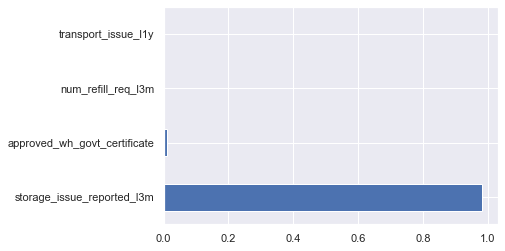

In [189]:
f_imp['Imp'].nlargest(4).plot(kind='barh');


In [190]:
data1=data.transpose()
data1.sort_values(by=['MAPE'])


,R2 Score,RMSE,MAPE
Basic RF Train,0.998,551.175,0.024
Bagging RF Train,0.997,672.069,0.031
Basic XGBoost Train,0.995,813.148,0.039
Basic XGBoost Test,0.994,897.604,0.043
Bagging RF Test,0.993,932.699,0.044
Basic RF Test,0.993,972.685,0.045
Grid XGBoost Train,0.994,921.463,0.045
Grid XGBoost Test,0.994,912.132,0.046
Grid Lasso Unscaled Test,0.978,1713.384,0.088
Basic Ridge Unscaled Test,0.978,1713.174,0.089
